In [2]:
import IPython
import sys

def clean_notebook():
    IPython.display.clear_output(wait=True)
    print("Notebook cleaned.")

# Run the installation commands
!pip install opendatasets
!pip install ultralytics

# Clean up the notebook
clean_notebook()



Notebook cleaned.


In [1]:

import ultralytics
ultralytics.checks()

Ultralytics 8.3.89 🚀 Python-3.12.3 torch-2.8.0.dev20250313+cu128 CUDA:0 (NVIDIA GeForce RTX 5090, 32098MiB)
Setup complete ✅ (32 CPUs, 62.3 GB RAM, 153.9/1455.6 GB disk)


# Apply images

100%|██████████| 5.35M/5.35M [00:00<00:00, 85.7MB/s]



image 1/1 /root/workspace/DL-FOR-COMPUTER-VISION/week07/../images/football_teamplay.jpeg: 224x320 6 persons, 1 sports ball, 11.5ms
Speed: 1.9ms preprocess, 11.5ms inference, 55.2ms postprocess per image at shape (1, 3, 224, 320)


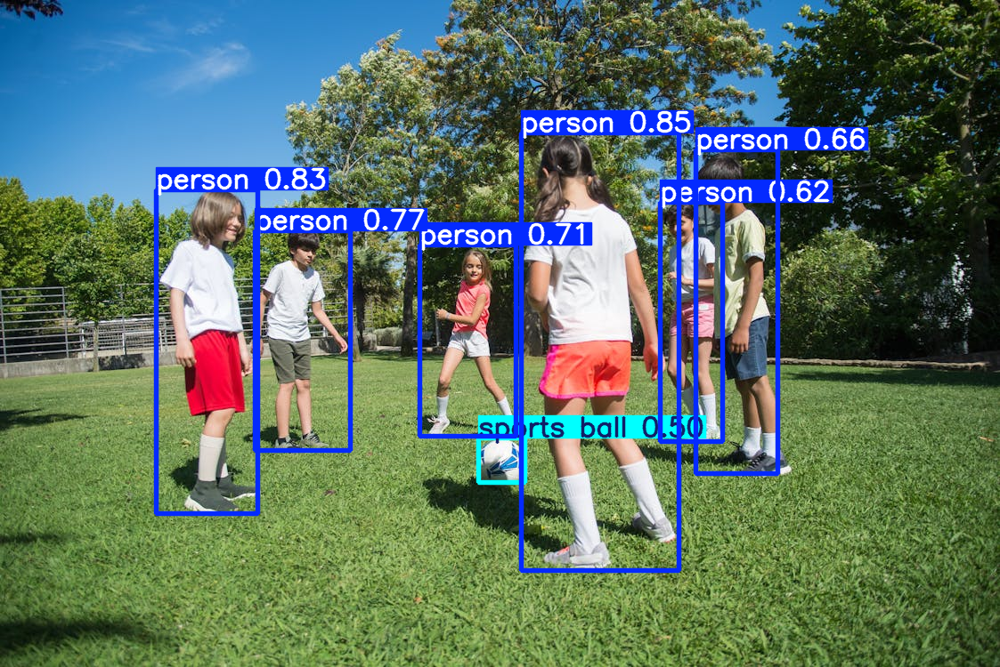

In [2]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolo11n.pt")

# Perform object detection on an image
results = model(".././images/football_teamplay.jpeg", imgsz= 320)
results[0].show()

In [9]:
# Process results list
for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    print(boxes)

ultralytics.engine.results.Boxes object with attributes:

cls: tensor([ 0.,  0.,  0.,  0.,  0.,  0., 32.], device='cuda:0')
conf: tensor([0.8462, 0.8328, 0.7647, 0.7131, 0.6570, 0.6155, 0.4961], device='cuda:0')
data: tensor([[5.8600e+02, 1.4934e+02, 7.6223e+02, 6.4168e+02, 8.4621e-01, 0.0000e+00],
        [1.7563e+02, 2.1308e+02, 2.8983e+02, 5.7702e+02, 8.3283e-01, 0.0000e+00],
        [2.8614e+02, 2.5916e+02, 3.9362e+02, 5.0655e+02, 7.6469e-01, 0.0000e+00],
        [4.7108e+02, 2.7553e+02, 5.7946e+02, 4.9067e+02, 7.1313e-01, 0.0000e+00],
        [7.8121e+02, 1.6882e+02, 8.7371e+02, 5.3266e+02, 6.5696e-01, 0.0000e+00],
        [7.4178e+02, 2.2775e+02, 8.1130e+02, 4.9651e+02, 6.1545e-01, 0.0000e+00],
        [5.3701e+02, 4.9247e+02, 5.8976e+02, 5.4259e+02, 4.9609e-01, 3.2000e+01]], device='cuda:0')
id: None
is_track: False
orig_shape: (750, 1123)
shape: torch.Size([7, 6])
xywh: tensor([[674.1128, 395.5087, 176.2328, 492.3468],
        [232.7332, 395.0504, 114.1997, 363.9389],
        [

# Apply with Open CV


image 1/1 /root/workspace/DL-FOR-COMPUTER-VISION/week07/../images/football_teamplay.jpeg: 448x640 6 persons, 1 sports ball, 9.0ms
Speed: 0.6ms preprocess, 9.0ms inference, 0.5ms postprocess per image at shape (1, 3, 448, 640)


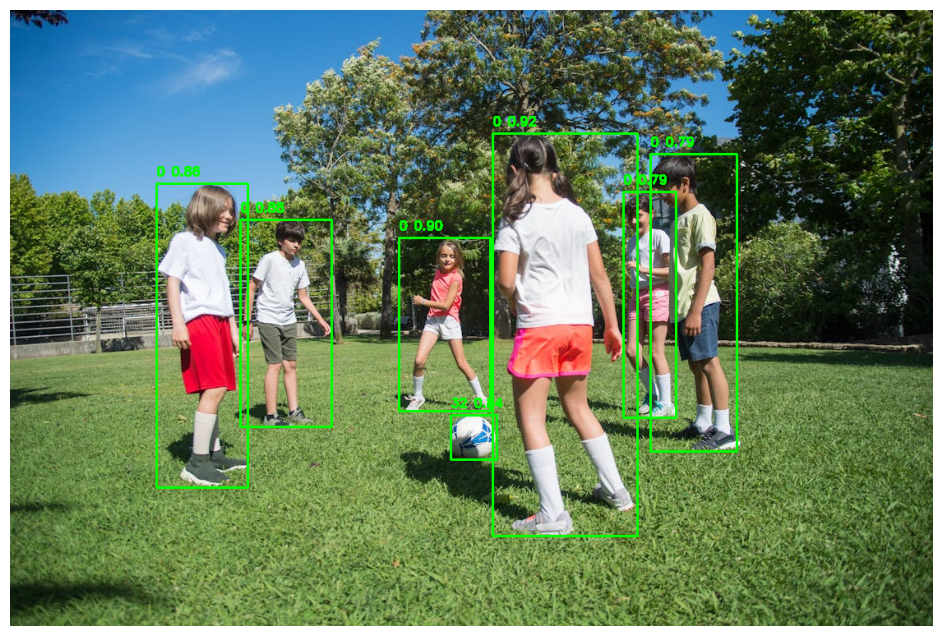

In [3]:
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO

# Load the YOLO model
model = YOLO("yolo11n.pt")

# Perform object detection on an image
results = model(".././images/football_teamplay.jpeg")

# Load the image using OpenCV
image = cv2.imread(".././images/football_teamplay.jpeg")

for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    
    # Loop through each box
    for box in boxes:
        # Extract the coordinates (x1, y1, x2, y2)
        x1, y1, x2, y2 = map(int, box.xyxy[0])  # Convert to integers
        
        # Draw the rectangle on the image
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)  # Green box with 2px thickness

        # Convert class and confidence to Python types
        class_id = int(box.cls[0]) if hasattr(box.cls, '__iter__') else int(box.cls)
        confidence = float(box.conf[0]) if hasattr(box.conf, '__iter__') else float(box.conf)
        
        # Optionally, add a label or confidence score
        label = f"{class_id} {confidence:.2f}"  # Class and confidence
        cv2.putText(image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

# Convert the BGR image to RGB for matplotlib
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Display the image using matplotlib

plt.figure(figsize=(15, 8))  # Adjust width and height as needed
plt.imshow(image_rgb)
plt.axis('off')  # Hide axes for better visualization
plt.show()




# Segmentation

100%|██████████| 5.90M/5.90M [00:00<00:00, 88.5MB/s]


image 1/1 /root/workspace/DL-FOR-COMPUTER-VISION/week07/../images/football_teamplay.jpeg: 448x640 6 persons, 1 sports ball, 4.0ms
Speed: 0.6ms preprocess, 4.0ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)


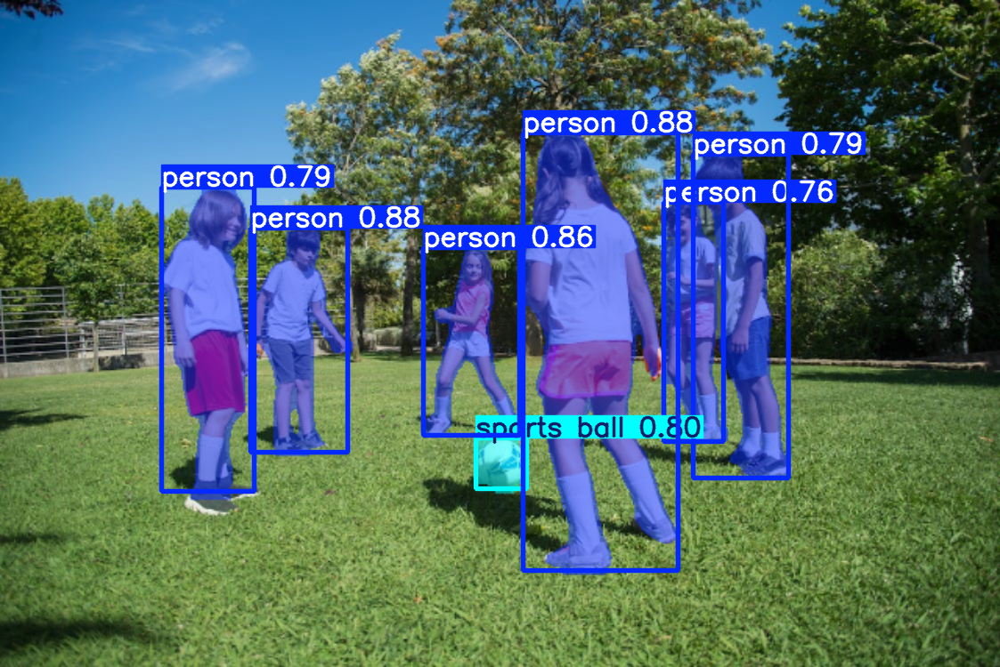

In [4]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolo11n-seg.pt")

# Perform object detection on an image
results = model(".././images/football_teamplay.jpeg", imgsz= 640)
results[0].show()

# Segmentation Each object

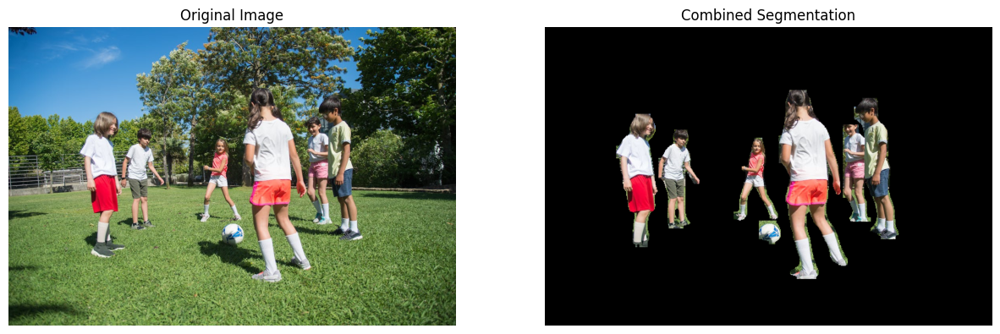

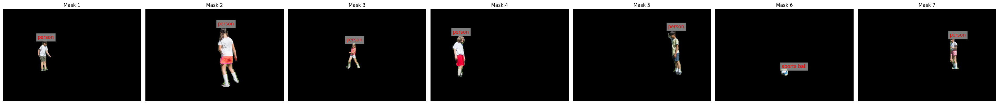

In [5]:
import cv2
from ultralytics import YOLO
import numpy as np
import matplotlib.pyplot as plt

# Load a model
model = YOLO("yolo11n-seg.pt")

# Perform object detection on an image
image_path = ".././images/football_teamplay.jpeg"

# Load the original image for visualization and operations (BGR by default)
original_image = cv2.imread(image_path)
height, width = original_image.shape[:2]

# Convert to RGB for plotting
rgb_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

# Run inference
results = model(rgb_image, imgsz=640, verbose=False)

# Check if we have any results and that they contain masks
if len(results) > 0 and hasattr(results[0], 'masks'):
    masks = results[0].masks
    object_count = len(masks.data)

    # Create a combined mask initialized to zeros
    combined_mask = np.zeros((height, width), dtype=np.uint8)

    for i in range(object_count):
        mask_array = masks.data[i].cpu().numpy().astype(np.uint8) * 255

        # Resize mask to match the original image if needed
        if mask_array.shape[:2] != (height, width):
            mask_array = cv2.resize(mask_array, (width, height), interpolation=cv2.INTER_NEAREST)

        # Combine masks
        combined_mask = cv2.bitwise_or(combined_mask, mask_array)

    # Apply the combined mask to the rgb_image
    combined_result = cv2.bitwise_and(rgb_image, rgb_image, mask=combined_mask)

    # Plot the original and combined segmented image
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(rgb_image)
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(combined_result)
    plt.title("Combined Segmentation")
    plt.axis('off')
    plt.show()

    # Plot each mask separately
    fig, axes = plt.subplots(1, object_count, figsize=(5 * object_count, 5))
    if object_count == 1:
        axes = [axes]

    # For labeling objects
    boxes = results[0].boxes.xyxy.cpu().numpy()  # [N,4]
    class_ids = results[0].boxes.cls.cpu().numpy().astype(int)  # class IDs for each detection

    for i in range(object_count):
        mask_array = masks.data[i].cpu().numpy().astype(np.uint8) * 255
        if mask_array.shape[:2] != (height, width):
            mask_array = cv2.resize(mask_array, (width, height), interpolation=cv2.INTER_NEAREST)

        # Apply this single mask
        masked_result = cv2.bitwise_and(rgb_image, rgb_image, mask=mask_array)

        # Get bounding box and label
        x1, y1, x2, y2 = boxes[i]
        cls_id = class_ids[i]
        label = model.names[cls_id] if cls_id in model.names else f"Class {cls_id}"

        axes[i].imshow(masked_result)
        axes[i].set_title(f"Mask {i+1}")
        axes[i].axis('off')

        # Place the label text slightly above the top-left corner of the bounding box
        text_y = max(y1 - 5, 0)
        axes[i].text(x1, text_y, label, color='red', fontsize=12, 
                     verticalalignment='bottom', horizontalalignment='left',
                     bbox=dict(facecolor='white', alpha=0.5))

    plt.tight_layout()
    plt.show()
else:
    print("No masks found in the results.")


In [11]:
masks.shape

torch.Size([6, 224, 320])

# Pose Estimation

100%|██████████| 5.97M/5.97M [00:00<00:00, 88.9MB/s]


image 1/1 /root/workspace/DL-FOR-COMPUTER-VISION/week07/../images/football_teamplay.jpeg: 224x320 6 persons, 4.9ms
Speed: 0.3ms preprocess, 4.9ms inference, 0.6ms postprocess per image at shape (1, 3, 224, 320)


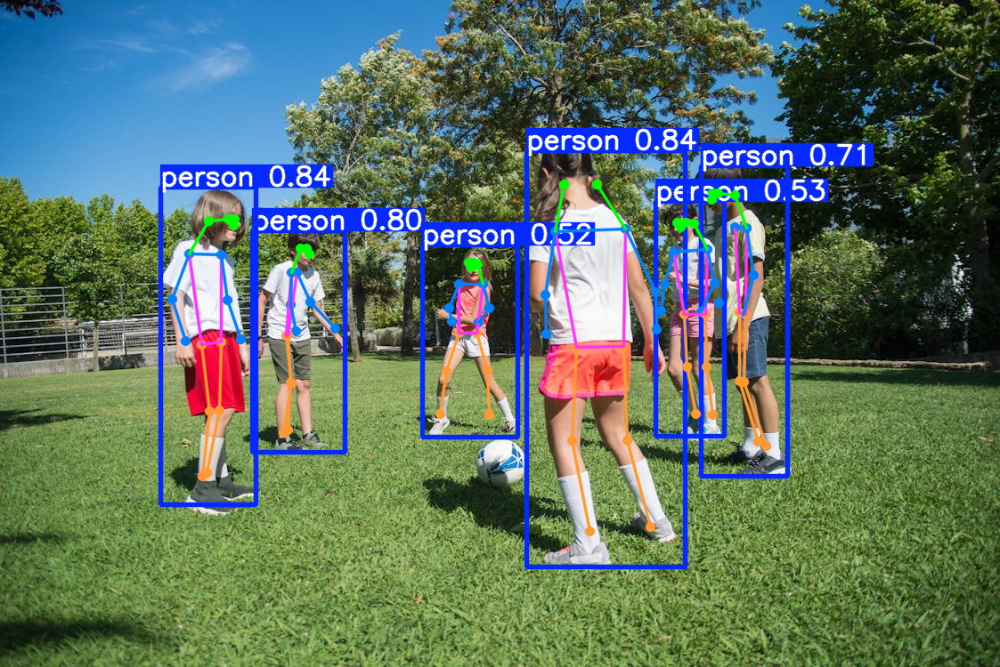

In [6]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolo11n-pose.pt")

# Perform object detection on an image
results = model(".././images/football_teamplay.jpeg", imgsz= 320)
results[0].show()

# Pose Estimation with opencv

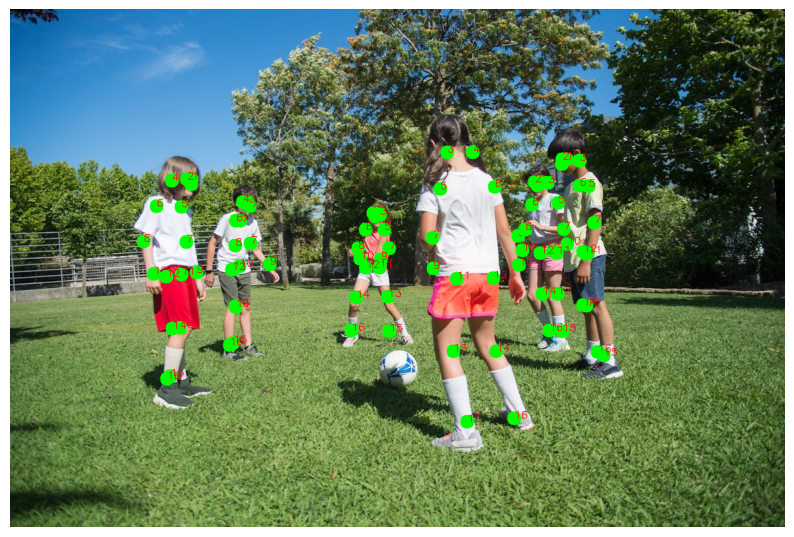

In [7]:
import cv2
import matplotlib.pyplot as plt

# Load the image
image = cv2.imread(".././images/football_teamplay.jpeg")
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Iterate over detected persons
for person in results[0].keypoints.data.cpu().numpy():
   
    for idx, keypoint in enumerate(person):
        x, y, confidence = keypoint
        if confidence > 0.5:  # Draw only if confidence is above a threshold
            cv2.circle(image_rgb, (int(x), int(y)), radius=10, color=(0, 255, 0), thickness=-1)
            cv2.putText(image_rgb, str(idx), (int(x), int(y)), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 1)

# Display the image using Matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(image_rgb)
plt.axis('off')  # Hide axes
plt.show()


In [15]:
person.shape

(17, 3)

In [16]:
person

array([[      529.2,      300.02,     0.77161],
       [     532.45,      295.22,     0.71288],
       [     526.12,      295.52,     0.67265],
       [     536.94,      297.36,     0.55266],
       [          0,           0,     0.44407],
       [     542.94,      319.28,     0.98115],
       [     515.03,      319.42,     0.97891],
       [     549.58,      346.59,     0.91586],
       [     504.57,      346.25,     0.87924],
       [     537.73,       362.6,     0.87311],
       [     507.92,      361.76,     0.83599],
       [     535.77,      374.88,     0.98543],
       [     515.15,      374.81,     0.98399],
       [     547.49,      416.76,     0.97825],
       [     501.68,      417.44,     0.97518],
       [     549.77,      466.45,     0.95919],
       [     494.47,      465.94,      0.9555]], dtype=float32)

# Pose Skeleton connections

```
skeleton = [
    (0, 1), (1, 2), (2, 3), (3, 4),      # Right arm
    (0, 5), (5, 6), (6, 7), (7, 8),      # Left arm
    (0, 9), (9, 10), (10, 11), (11, 12), # Right leg
    (0, 13), (13, 14), (14, 15), (15, 16) # Left leg
]

```

100%|██████████| 6.52M/6.52M [00:00<00:00, 77.3MB/s]


image 1/1 /root/workspace/DL-FOR-COMPUTER-VISION/week07/../images/football_teamplay.jpeg: 448x640 6 persons, 5.0ms
Speed: 0.7ms preprocess, 5.0ms inference, 0.5ms postprocess per image at shape (1, 3, 448, 640)


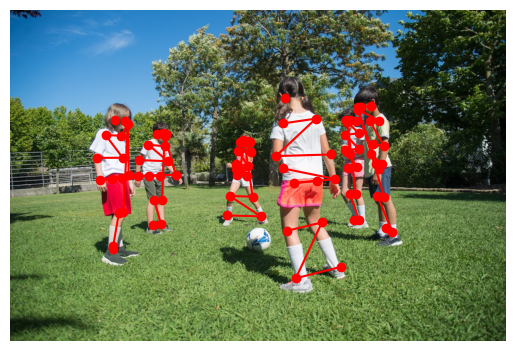

In [8]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
from ultralytics import YOLO

# Load the YOLO pose estimation model
model = YOLO("yolov8n-pose.pt")  # Ensure you have the correct model file

# Perform inference on the input image
image_path = ".././images/football_teamplay.jpeg"
results = model(image_path)

# Load the original image
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Define the skeleton connections based on COCO keypoints
skeleton = [
    (0, 1), (1, 2), (2, 3), (3, 4),      # Right arm
    (0, 5), (5, 6), (6, 7), (7, 8),      # Left arm
    (0, 9), (9, 10), (10, 11), (11, 12), # Right leg
    (0, 13), (13, 14), (14, 15), (15, 16) # Left leg
]

# Create a Matplotlib figure
fig, ax = plt.subplots()
ax.imshow(image_rgb)

# Iterate over detected persons
for person in results[0].keypoints.data.cpu().numpy():
    keypoints = person[:, :2]  # Extract (x, y) coordinates
    confidences = person[:, 2]  # Extract confidence scores

    # Plot keypoints
    for i, (x, y) in enumerate(keypoints):
        if confidences[i] > 0.5:  # Plot only if confidence is above threshold
            ax.plot(x, y, 'ro')  # Red dot for keypoint

    # Plot skeleton connections
    for joint_start, joint_end in skeleton:
        if confidences[joint_start] > 0.5 and confidences[joint_end] > 0.5:
            x_start, y_start = keypoints[joint_start]
            x_end, y_end = keypoints[joint_end]
            ax.plot([x_start, x_end], [y_start, y_end], 'r-')  # Red line for skeleton

# Remove axis labels
ax.axis('off')

# Display the result
plt.show()
